In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from fastai.vision import *

In [3]:
import torch
torch.cuda.is_available()

True

In [4]:
torch.backends.cudnn.enabled

True

# The way to download new data through Google image

Here we will focus on cars: Toyota or Honda

Javascript to download images:
urls = Array.from(document.querySelectorAll('.rg_di .rg_meta')).map(el=>JSON.parse(el.textContent).ou);
window.open('data:text/csv;charset=utf-8,' + escape(urls.join('\n')));

In [8]:
folder='honda'
file='urls_honda.txt'

In [6]:
folder='toyota'
file='urls_toyota.txt'

In [38]:
folder='ford'
file='urls_ford.txt'

In [9]:
path = Path('data/cars')
dest = path/folder
dest.mkdir(parents=True, exist_ok=True)

In [11]:
classes=['honda', 'toyota', 'ford']

In [40]:
download_images(path/file, dest, max_pics=300)

Error https://www.washingtonpost.com/resizer/Nv25VF7yE01XACHccq2ptnAgPSQ=/480x0/arc-anglerfish-washpost-prod-washpost.s3.amazonaws.com/public/BWD3LFCQSE7IXEPKE3BQ2VEF3E.jpg HTTPSConnectionPool(host='www.washingtonpost.com', port=443): Read timed out. (read timeout=4)


## Now a little bit of validation

In [10]:
path.ls()

[PosixPath('data/cars/urls_ford.txt'),
 PosixPath('data/cars/models'),
 PosixPath('data/cars/honda'),
 PosixPath('data/cars/urls_toyota.txt'),
 PosixPath('data/cars/ford'),
 PosixPath('data/cars/urls_honda.txt'),
 PosixPath('data/cars/toyota')]

In [12]:
for c in classes:
    print(c)
    verify_images(path/c, delete=True, max_size=500)

honda


toyota


ford


# Now view

In [13]:
np.random.seed(10)
data = ImageDataBunch.from_folder(path, train='.', valid_pct=0.2,
            ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)

In [14]:
data.classes

['ford', 'honda', 'toyota']

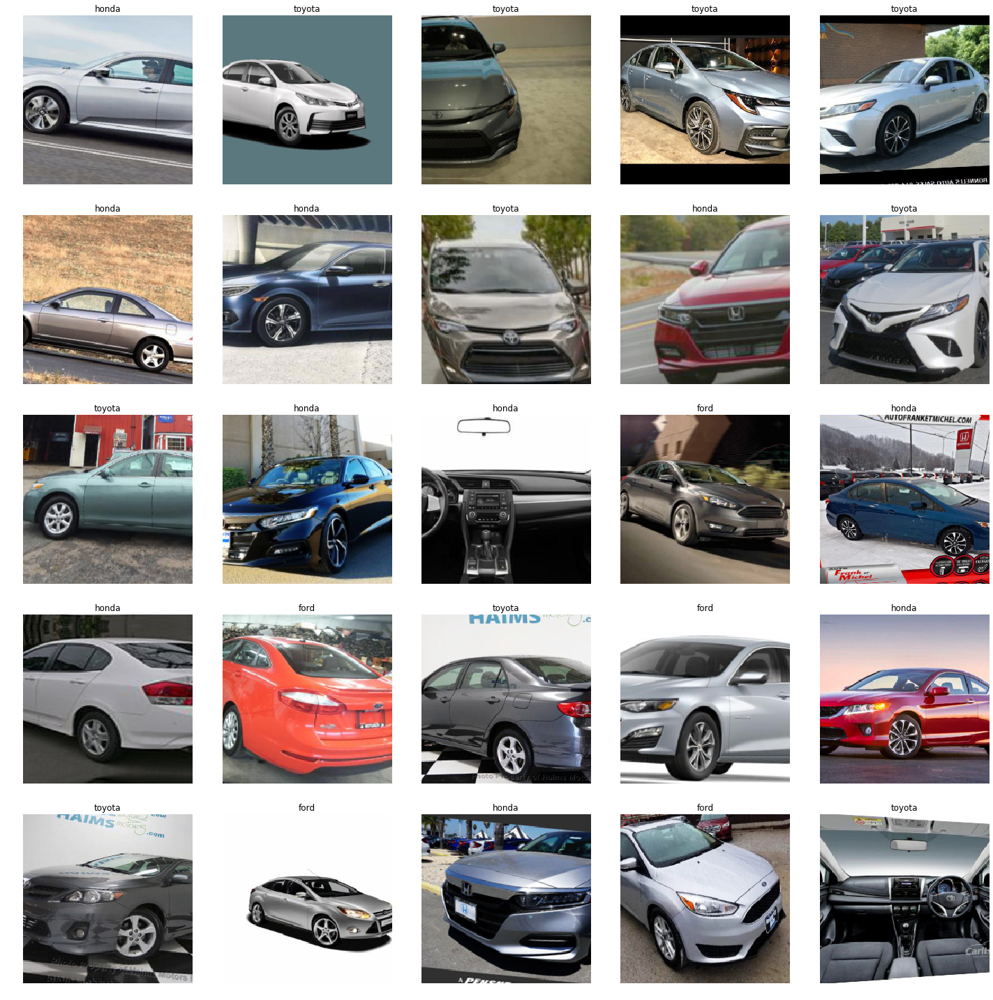

In [23]:
data.show_batch(rows=5)

In [20]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['ford', 'honda', 'toyota'], 3, 636, 158)

In [21]:
learn = create_cnn(data, models.resnet34, metrics=error_rate)

In [22]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,error_rate
1,1.436758,1.059692,0.500000
2,1.231859,0.852807,0.367089
3,1.090174,0.860289,0.417722
4,0.997421,0.826093,0.449367
5,0.925204,0.821588,0.436709


# Not a good result

A lot of the images have the logo cut out :(. Try a new experiement

In [25]:
folder='SUV'
file='urls_SUV.txt'

In [31]:
folder='truck'
file='urls_truck.txt'

In [34]:
folder='sedan'
file='urls_sedan.txt'

In [35]:
path = Path('data/car_type')
dest = path/folder
dest.mkdir(parents=True, exist_ok=True)
classes=['SUV', 'truck', 'sedan']

In [27]:
path.ls()

[PosixPath('data/car_type/SUV')]

In [36]:
download_images(path/file, dest, max_pics=300)

In [37]:
classes

['SUV', 'truck', 'sedan']

In [38]:
for c in classes:
    print(c)
    verify_images(path/c, delete=True, max_size=500)

SUV


cannot identify image file <_io.BufferedReader name='data/car_type/SUV/00000125.jpg'>
cannot identify image file <_io.BufferedReader name='data/car_type/SUV/00000265.jpg'>
Image data/car_type/SUV/00000055.png has 1 instead of 3 channels


/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +


Image data/car_type/SUV/00000078.png has 1 instead of 3 channels
Image data/car_type/SUV/00000201.png has 1 instead of 3 channels
Image data/car_type/SUV/00000120.png has 1 instead of 3 channels
Image data/car_type/SUV/00000231.png has 1 instead of 3 channels
Image data/car_type/SUV/00000028.png has 1 instead of 3 channels
cannot identify image file <_io.BufferedReader name='data/car_type/SUV/00000006.jpg'>
Image data/car_type/SUV/00000071.png has 4 instead of 3 channels


/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +


Image data/car_type/SUV/00000243.png has 4 instead of 3 channels
cannot identify image file <_io.BufferedReader name='data/car_type/SUV/00000232.jpg'>


/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +


cannot identify image file <_io.BufferedReader name='data/car_type/SUV/00000027.png'>
cannot identify image file <_io.BufferedReader name='data/car_type/SUV/00000191.jpg'>
cannot identify image file <_io.BufferedReader name='data/car_type/SUV/00000091.jpg'>
Image data/car_type/SUV/00000159.png has 4 instead of 3 channels
cannot identify image file <_io.BufferedReader name='data/car_type/SUV/00000080.jpg'>
truck


cannot identify image file <_io.BufferedReader name='data/car_type/truck/00000245.jpg'>
cannot identify image file <_io.BufferedReader name='data/car_type/truck/00000224.jpg'>
cannot identify image file <_io.BufferedReader name='data/car_type/truck/00000110.jpg'>
cannot identify image file <_io.BufferedReader name='data/car_type/truck/00000296.jpg'>
cannot identify image file <_io.BufferedReader name='data/car_type/truck/00000214.png'>
cannot identify image file <_io.BufferedReader name='data/car_type/truck/00000062.jpg'>
Image data/car_type/truck/00000075.png has 4 instead of 3 channels
Image data/car_type/truck/00000275.png has 4 instead of 3 channels
cannot identify image file <_io.BufferedReader name='data/car_type/truck/00000230.jpg'>
cannot identify image file <_io.BufferedReader name='data/car_type/truck/00000183.jpg'>
cannot identify image file <_io.BufferedReader name='data/car_type/truck/00000235.png'>
cannot identify image file <_io.BufferedReader name='data/car_type/truck/0

/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +


cannot identify image file <_io.BufferedReader name='data/car_type/truck/00000182.png'>
sedan


cannot identify image file <_io.BufferedReader name='data/car_type/sedan/00000029.jpg'>
Image data/car_type/sedan/00000205.jpg has 1 instead of 3 channels
cannot identify image file <_io.BufferedReader name='data/car_type/sedan/00000144.jpg'>


/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +


Image data/car_type/sedan/00000055.png has 1 instead of 3 channels
cannot identify image file <_io.BufferedReader name='data/car_type/sedan/00000228.jpg'>
cannot identify image file <_io.BufferedReader name='data/car_type/sedan/00000210.jpg'>
Image data/car_type/sedan/00000031.png has 4 instead of 3 channels
cannot identify image file <_io.BufferedReader name='data/car_type/sedan/00000120.jpg'>
cannot identify image file <_io.BufferedReader name='data/car_type/sedan/00000185.jpg'>
Image data/car_type/sedan/00000022.png has 4 instead of 3 channels
cannot identify image file <_io.BufferedReader name='data/car_type/sedan/00000032.jpg'>
cannot identify image file <_io.BufferedReader name='data/car_type/sedan/00000225.jpg'>
Image data/car_type/sedan/00000038.png has 4 instead of 3 channels
Image data/car_type/sedan/00000004.png has 1 instead of 3 channels


/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +
/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +
/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +


Image data/car_type/sedan/00000058.png has 4 instead of 3 channels
Image data/car_type/sedan/00000083.png has 4 instead of 3 channels


/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +
/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +
/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +
/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  ' expressed in bytes should be converted ' +
/home/luan/anaconda3/lib/python3.7/site-packages/PIL/Image.py:952: UserWarning: Palette images with Transparency   expressed in bytes sh

# Train again


In [39]:
np.random.seed(10)
data = ImageDataBunch.from_folder(path, train='.', valid_pct=0.2,
            ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)

In [40]:
data.classes

['SUV', 'sedan', 'truck']

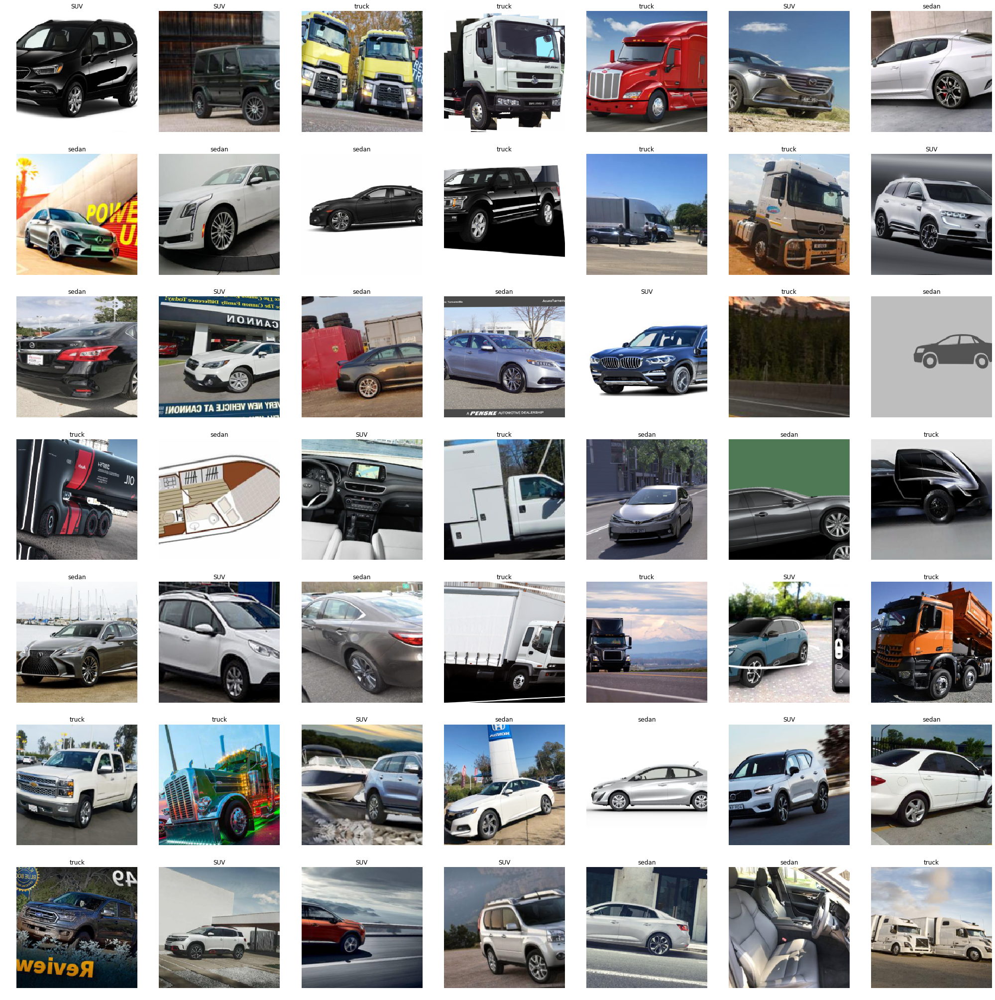

In [42]:
data.show_batch(rows=7)

In [43]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['SUV', 'sedan', 'truck'], 3, 661, 165)

In [44]:
learn = create_cnn(data, models.resnet34, metrics=error_rate)

In [45]:
learn.fit_one_cycle(5)

epoch,train_loss,valid_loss,error_rate
1,1.115123,0.599697,0.266667
2,0.815911,0.474272,0.206061
3,0.656405,0.454036,0.242424
4,0.565728,0.450735,0.218182
5,0.496148,0.442789,0.212121


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


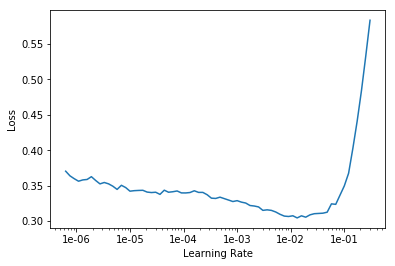

In [47]:
learn.lr_find()
learn.recorder.plot()

In [48]:
learn.save('stage-1')

In [59]:
learn.load('stage-1')

Learner(data=ImageDataBunch;

Train: LabelList
y: CategoryList (661 items)
[Category truck, Category truck, Category truck, Category truck, Category truck]...
Path: data/car_type
x: ImageItemList (661 items)
[Image (3, 374, 499), Image (3, 168, 220), Image (3, 181, 500), Image (3, 375, 500), Image (3, 299, 500)]...
Path: data/car_type;

Valid: LabelList
y: CategoryList (165 items)
[Category SUV, Category truck, Category SUV, Category sedan, Category sedan]...
Path: data/car_type
x: ImageItemList (165 items)
[Image (3, 375, 500), Image (3, 333, 500), Image (3, 266, 500), Image (3, 333, 500), Image (3, 236, 420)]...
Path: data/car_type;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
    

In [60]:
learn.unfreeze()
learn.fit_one_cycle(5, max_lr=slice(1e-05, 1e-02))

epoch,train_loss,valid_loss,error_rate
1,0.385124,0.581240,0.218182
2,0.387299,0.987344,0.248485
3,0.365712,0.547938,0.139394
4,0.304054,0.436789,0.163636
5,0.250741,0.364759,0.151515


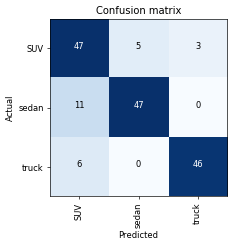

In [63]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(dpi=60)

# Try the teddy, black and grizzly bears (as in the class's example)

In [5]:
folder='teddys'
file='urls_teddys.txt'

In [12]:
folder='grizzly'
file='urls_grizzly.txt'

In [16]:
folder='black'
file='urls_black.txt'

In [6]:
path = Path('data/bears')
dest = path/folder
dest.mkdir(parents=True, exist_ok=True)
classes=['teddys', 'grizzly', 'black']

In [7]:
path.ls()

[PosixPath('data/bears/teddys')]

In [18]:
download_images(path/file, dest, max_pics=300)

Error https://www.washingtonpost.com/resizer/8oTEoyrrxY092B3yebDUUAdQLdM=/480x0/arc-anglerfish-washpost-prod-washpost.s3.amazonaws.com/public/XK6YBT5GSE2LROLN3FO4WRK5JI.jpg HTTPSConnectionPool(host='www.washingtonpost.com', port=443): Read timed out. (read timeout=4)
Error https://caldwellzoo.org/wp-content/uploads/2017/04/NORTH-AMERICAN-BLACK-BEAR.jpg HTTPSConnectionPool(host='caldwellzoo.org', port=443): Max retries exceeded with url: /wp-content/uploads/2017/04/NORTH-AMERICAN-BLACK-BEAR.jpg (Caused by SSLError(SSLError("bad handshake: Error([('SSL routines', 'tls_process_server_certificate', 'certificate verify failed')])")))


In [19]:
classes

['teddys', 'grizzly', 'black']

In [7]:
for c in classes:
    print(c)
    verify_images(path/c, delete=True, max_size=500)

teddys


grizzly


black


In [8]:
np.random.seed(10)
data = ImageDataBunch.from_folder(path, train='.', valid_pct=0.2,
            ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)

In [9]:
data.classes

['black', 'grizzly', 'teddys']

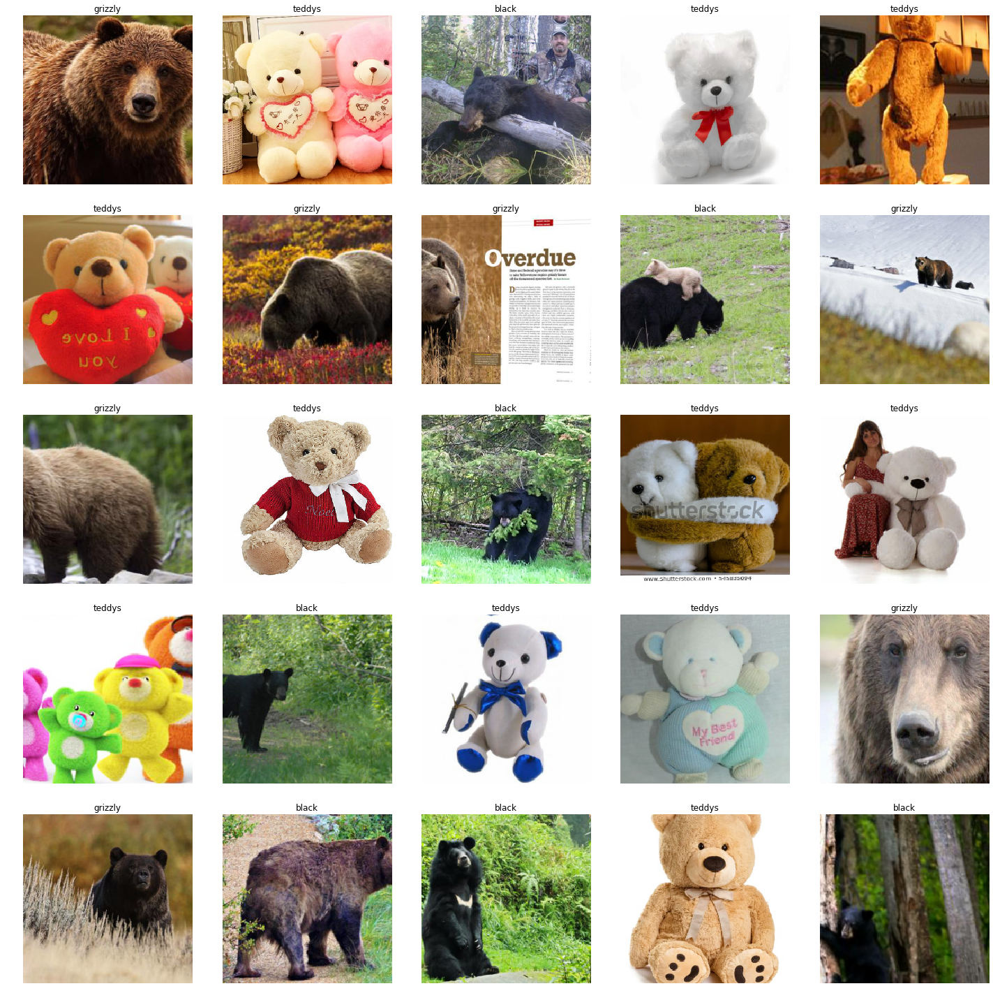

In [10]:
data.show_batch(rows=5)

In [11]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['black', 'grizzly', 'teddys'], 3, 647, 161)

In [12]:
learn = create_cnn(data, models.resnet34, metrics=error_rate)

In [13]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate
1,0.772894,0.083080,0.012422
2,0.411463,0.032461,0.006211
3,0.290126,0.032954,0.006211
4,0.230959,0.033802,0.006211


In [14]:
learn.save('stage-1')

In [18]:
learn.load('stage-1')

Learner(data=ImageDataBunch;

Train: LabelList
y: CategoryList (647 items)
[Category teddys, Category teddys, Category teddys, Category teddys, Category teddys]...
Path: data/bears
x: ImageItemList (647 items)
[Image (3, 500, 500), Image (3, 218, 218), Image (3, 360, 360), Image (3, 260, 260), Image (3, 500, 500)]...
Path: data/bears;

Valid: LabelList
y: CategoryList (161 items)
[Category grizzly, Category grizzly, Category teddys, Category grizzly, Category grizzly]...
Path: data/bears
x: ImageItemList (161 items)
[Image (3, 281, 500), Image (3, 333, 500), Image (3, 312, 500), Image (3, 333, 500), Image (3, 281, 500)]...
Path: data/bears;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


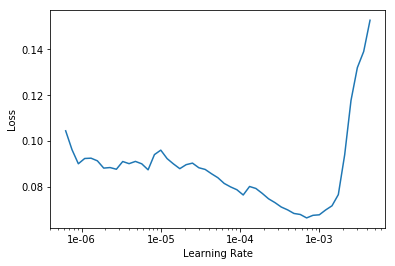

In [19]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

In [20]:
learn.fit_one_cycle(3, max_lr=slice(1e-07, 1e-05 ))

epoch,train_loss,valid_loss,error_rate
1,0.087177,0.037612,0.012422
2,0.083913,0.035666,0.006211
3,0.080168,0.035730,0.006211


In [21]:
learn.save('stage-2')